# **DA5401 – Assignment 5**
**Name:** Adarsh Tare

**Roll No:** MM22B016


### **Notebook outline**
- Part A: Preprocessing and Initial Setup
- Part B: T-SNE and Veracity Inspection
- Part C: Isomap and Manifold Learning

## **Part A — Preprocessing and Initial Setup**

### **Importing libraries**

In [53]:
import numpy as np
import pandas as pd
from scipy.io import arff
from collections import Counter
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE
from scipy.stats import zscore
from sklearn.manifold import Isomap
import matplotlib.pyplot as plt
import xml.etree.ElementTree as ET

### **Data loading**

In [54]:
# Load the dataset from the ARFF file
raw_data, metadata = arff.loadarff('yeast.arff')

# Convert the ARFF data to a pandas DataFrame
yeast_df = pd.DataFrame(raw_data)

# Decode byte strings to UTF-8 to make the DataFrame human-readable
yeast_df = yeast_df.applymap(lambda val: val.decode('utf-8') if isinstance(val, bytes) else val)
print(f"Dataset loaded successfully: {yeast_df.shape[0]} rows and {yeast_df.shape[1]} columns.")

Dataset loaded successfully: 2417 rows and 117 columns.


/tmp/ipython-input-2607859441.py:8: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  yeast_df = yeast_df.applymap(lambda val: val.decode('utf-8') if isinstance(val, bytes) else val)


In [55]:
# Parse the XML file containing label information
xml_tree = ET.parse('yeast.xml')
xml_root = xml_tree.getroot()

# Extract label elements using the namespace specified in the XML structure
label_elements = xml_root.findall('.//{http://mulan.sourceforge.net/labels}label')

# Retrieve the names of all labels from their attributes
label_list = [label.get('name') for label in label_elements]
print(f"Total labels identified: {len(label_list)}")
print("Label names:", label_list)

Total labels identified: 14
Label names: ['Class1', 'Class2', 'Class3', 'Class6', 'Class4', 'Class10', 'Class11', 'Class5', 'Class7', 'Class8', 'Class9', 'Class12', 'Class13', 'Class14']


In [56]:
num_labels = 14

# Split the dataset into features (X) and labels (Y)
X_features = yeast_df.iloc[:, :-num_labels].astype(float)
Y_targets = yeast_df.iloc[:, -num_labels:].astype(int)

# Assign the label names extracted earlier to the label DataFrame
Y_targets.columns = label_list

# Display shapes for verification and preview of feature data
print(f"Feature matrix shape: {X_features.shape}")
X_features.head()

Feature matrix shape: (2417, 103)


,Att1,Att2,Att3,Att4,Att5,Att6,Att7,Att8,Att9,Att10,...,Att94,Att95,Att96,Att97,Att98,Att99,Att100,Att101,Att102,Att103
0,0.004168,-0.170975,-0.156748,-0.142151,0.058781,0.026851,0.197719,0.041850,0.066938,-0.056617,...,0.006166,-0.012976,-0.014259,-0.015024,-0.010747,0.000411,-0.032056,-0.018312,0.030126,0.124722
1,-0.103956,0.011879,-0.098986,-0.054501,-0.007970,0.049113,-0.030580,-0.077933,-0.080529,-0.016267,...,0.007680,0.027719,-0.085811,0.111123,0.050541,0.027565,-0.063569,-0.041471,-0.079758,0.017161
2,0.509949,0.401709,0.293799,0.087714,0.011686,-0.006411,-0.006255,0.013646,-0.040666,-0.024447,...,0.096277,-0.044932,-0.089470,-0.009162,-0.012010,0.308378,-0.028053,0.026710,-0.066565,-0.122352
3,0.119092,0.004412,-0.002262,0.072254,0.044512,-0.051467,0.074686,-0.007670,0.079438,0.062184,...,-0.083809,0.200354,-0.075716,0.196605,0.152758,-0.028484,-0.074207,-0.089227,-0.049913,-0.043893
4,0.042037,0.007054,-0.069483,0.081015,-0.048207,0.089446,-0.004947,0.064456,-0.133387,0.068878,...,-0.060467,0.044351,-0.057209,0.028047,0.029661,-0.050026,0.023248,-0.061539,-0.035160,0.067834


In [57]:
# Display the shape of the target (label) dataset and preview its content
print(f"Label matrix shape: {Y_targets.shape}")
Y_targets.head()

Label matrix shape: (2417, 14)


,Class1,Class2,Class3,Class6,Class4,Class10,Class11,Class5,Class7,Class8,Class9,Class12,Class13,Class14
0,0,0,0,0,0,0,1,1,0,0,0,1,1,0
1,0,0,1,1,0,0,0,0,0,0,0,0,0,0
2,0,1,1,0,0,0,0,0,0,0,0,1,1,0
3,0,0,1,1,0,0,0,0,0,0,0,0,0,0
4,0,0,1,1,1,1,0,0,0,0,0,0,0,0


### **Retrieve dataset dimensions**

In [58]:
num_instances = X_features.shape[0]
num_features = X_features.shape[1]
num_labels = Y_targets.shape[1]

# Display the extracted information
print(f"Number of instances (data points): {num_instances}")
print(f"Number of features: {num_features}")
print(f"Number of labels: {num_labels}")

Number of instances (data points): 2417
Number of features: 103
Number of labels: 14


###**Choosing labels for visualization**

Construct a categorical index for visualization that includes: the two most common single-label classes, the most frequent multi-label combination, and an additional category labeled 'Other'.

In [59]:
# Identify rows that contain exactly one active label (pure single-label instances)
single_label_mask = (Y_targets.sum(axis=1) == 1)

# Count occurrences of each label among those single-label instances
single_label_counts = (
    Y_targets[single_label_mask]
    .sum(axis=0)
    .sort_values(ascending=False)
)

# Extract the top 2 most frequent single-label classes
top_two_single_labels = single_label_counts.index[:2].tolist()

# Display the top results and summary counts
print("Top 2 single-label classes (from pure single-label rows):", top_two_single_labels)
print("Label distribution among single-label rows:\n", single_label_counts.head(6))


Top 2 single-label classes (from pure single-label rows): ['Class1', 'Class2']
Label distribution among single-label rows:
 Class1     32
Class2      0
Class3      0
Class6      0
Class4      0
Class10     0
dtype: int64


In [60]:
# Identify rows that contain more than one active label (multi-label instances)
multi_label_mask = (Y_targets.sum(axis=1) > 1)

# Proceed only if there are any multi-label samples
if multi_label_mask.sum() > 0:
    # Represent each multi-label combination as a tuple of 0s and 1s
    multi_label_keys = Y_targets[multi_label_mask].apply(lambda row: tuple(row.values.tolist()), axis=1)
    multi_label_counts = multi_label_keys.value_counts()
    most_common_multilabel = multi_label_counts.index[0]


    print("Most frequent multi-label combination (represented as a 14-element tuple):")
    print(most_common_multilabel)
    print(f"Occurrence count: {multi_label_counts.iloc[0]}")


Most frequent multi-label combination (represented as a 14-element tuple):
(0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0)
Occurrence count: 237


### **Function to assign a color index based on label configuration**

In [61]:
def assign_color_index(row):
    active_labels = [label for label, val in row.items() if val == 1]

    # Case 1: Single-label instance belonging to one of the top two single-label classes
    if len(active_labels) == 1 and active_labels[0] in top_two_single_labels:
        return 0 if active_labels[0] == top_two_single_labels[0] else 1

    # Case 2: Multi-label instance matching the most frequent label combination
    if 'most_common_multilabel' in globals() and tuple(row.values.tolist()) == most_common_multilabel:
        return 2

    # Case 3: All other label configurations
    return 3

color_index_codes = Y_targets.apply(assign_color_index, axis=1).astype(int)


In [62]:


# Count the number of instances in each color category
category_counts = Counter(color_index_codes.tolist())
category_mapping = {
    0: f"TopSingle_1: {top_two_single_labels[0] if len(top_two_single_labels) > 0 else 'N/A'}",
    1: f"TopSingle_2: {top_two_single_labels[1] if len(top_two_single_labels) > 1 else 'N/A'}",
    2: "MostFreqMulti",
    3: "Other"
}

# Display counts for each category
print("Category counts:")
for code in range(4):
    print(code, category_mapping[code], "->", category_counts.get(code, 0))

# Create a label list for visualization based on the mapping
color_category_labels = [category_mapping[c] for c in color_index_codes]


Category counts:
0 TopSingle_1: Class1 -> 32
1 TopSingle_2: Class2 -> 0
2 MostFreqMulti -> 237
3 Other -> 2148


### **Scaling**

Feature scaling is crucial for algorithms that rely on distances, as they are strongly affected by the magnitude of input values. If features are not scaled, those with larger numerical ranges can dominate distance calculations, causing the model to overemphasize them simply because of their scale rather than their true importance. By normalizing or standardizing all features to a similar range, scaling ensures that each feature has an equal influence on the analysis. This helps the model uncover the actual patterns in the data without being skewed by differences in units or value ranges.

In [63]:
scaler = StandardScaler()
X_features_scaled = scaler.fit_transform(X_features)
print(f"Scaled feature matrix shape: {X_features_scaled.shape}")

# Convert the scaled array back to a pandas DataFrame for easier handling
X_scaled_df = pd.DataFrame(X_features_scaled, columns=X_features.columns)
X_scaled_df.head()

Scaled feature matrix shape: (2417, 103)


,Att1,Att2,Att3,Att4,Att5,Att6,Att7,Att8,Att9,Att10,...,Att94,Att95,Att96,Att97,Att98,Att99,Att100,Att101,Att102,Att103
0,0.030752,-1.742591,-1.601326,-1.468980,0.594010,0.271117,2.023802,0.428070,0.683885,-0.584890,...,0.074380,-0.139039,-0.142884,-0.162409,-0.115009,0.020075,-0.320076,-0.178076,0.320417,1.178867
1,-1.079454,0.125835,-1.010264,-0.564893,-0.094933,0.499948,-0.326167,-0.809579,-0.847347,-0.167984,...,0.090608,0.281957,-0.886751,1.143263,0.521680,0.307877,-0.645355,-0.423947,-0.859425,0.096189
2,5.224059,4.109170,3.008988,0.902018,0.107939,-0.070783,-0.075781,0.136654,-0.433427,-0.252502,...,1.040237,-0.469629,-0.924791,-0.101735,-0.128129,3.284185,-0.278757,0.299908,-0.717769,-1.308110
3,1.210780,0.049537,-0.020516,0.742552,0.446738,-0.533913,0.757376,-0.083592,0.813679,0.642590,...,-0.890019,2.067892,-0.781802,2.028035,1.583559,-0.286180,-0.755161,-0.930956,-0.538974,-0.518363
4,0.419587,0.076533,-0.708369,0.832919,-0.510222,0.914530,-0.062317,0.661644,-1.396200,0.711754,...,-0.639827,0.454017,-0.589400,0.283393,0.304769,-0.514501,0.250775,-0.637002,-0.380569,0.606249


## **Part B — t-SNE and Veracity Inspection**

### **Implementation of t-SNE**

In [64]:
import matplotlib.pyplot as plt
import seaborn as sns
perplexities = [1, 5, 10, 15, 20, 30, 40, 50]
tsne_embeddings = {}

# Compute t-SNE embeddings for each perplexity value
for perp in perplexities:
    tsne = TSNE(
        n_components=2,
        perplexity=perp,
        random_state=42,
        init='pca',
        learning_rate='auto'
    )
    tsne_embeddings[perp] = tsne.fit_transform(X_features_scaled)
    print(f"t-SNE computed for perplexity: {perp}")


t-SNE computed for perplexity: 1
t-SNE computed for perplexity: 5
t-SNE computed for perplexity: 10
t-SNE computed for perplexity: 15
t-SNE computed for perplexity: 20
t-SNE computed for perplexity: 30
t-SNE computed for perplexity: 40
t-SNE computed for perplexity: 50


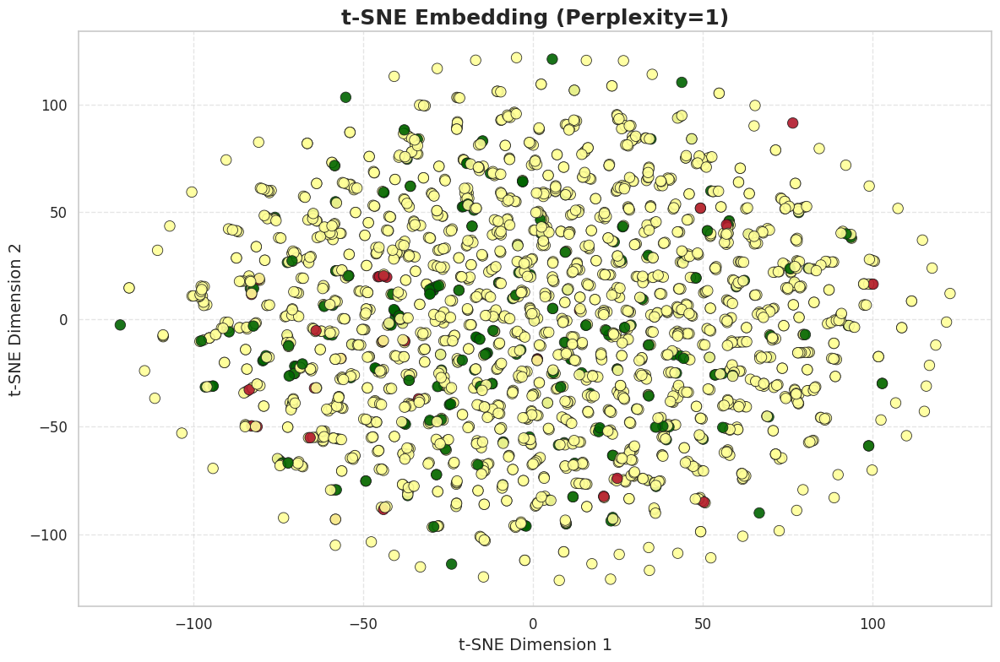

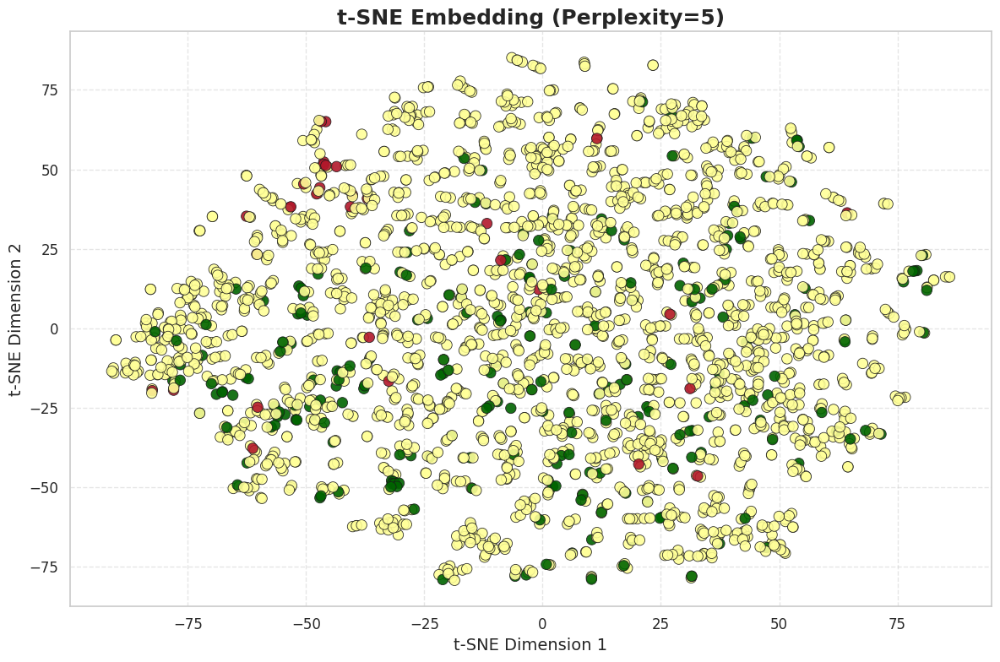

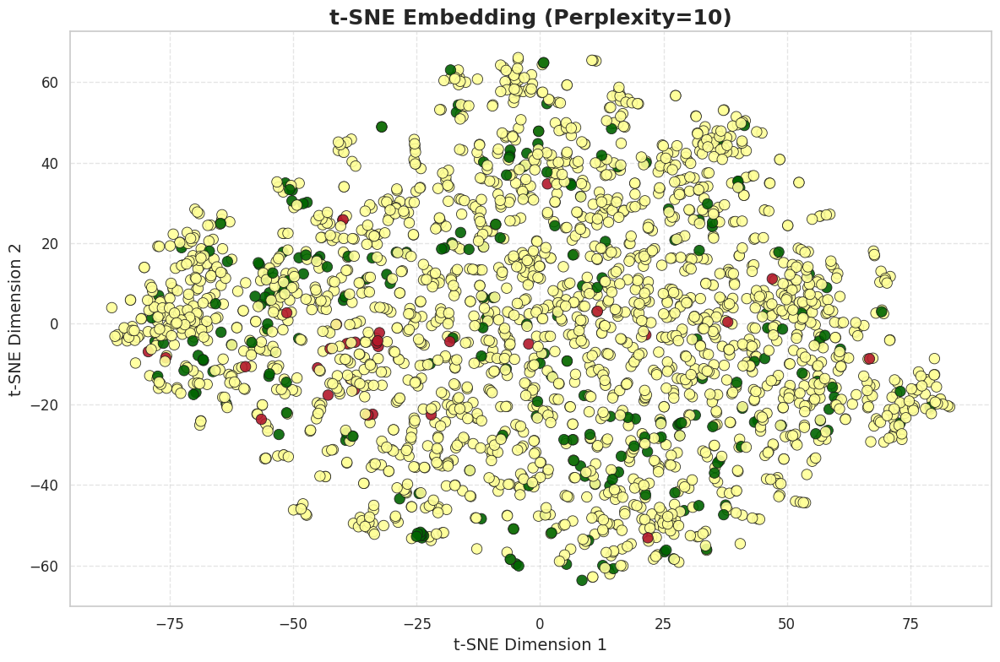

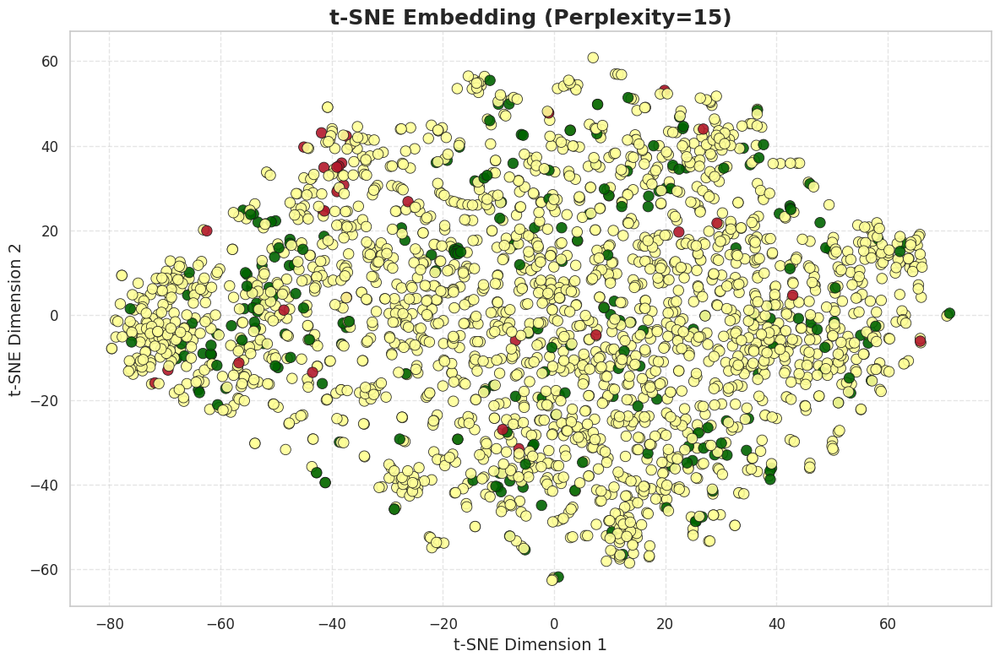

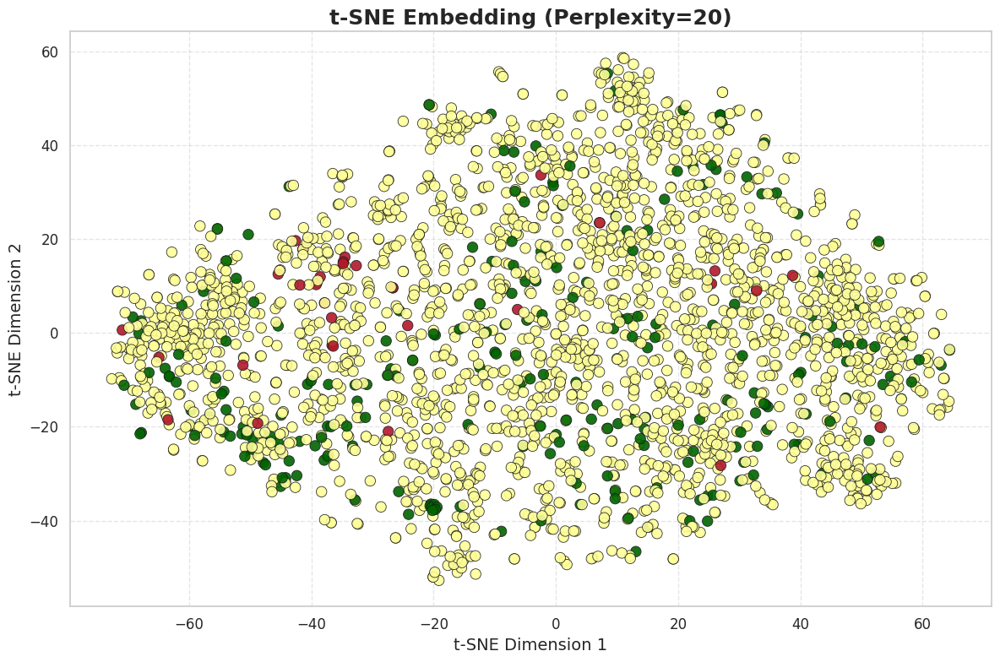

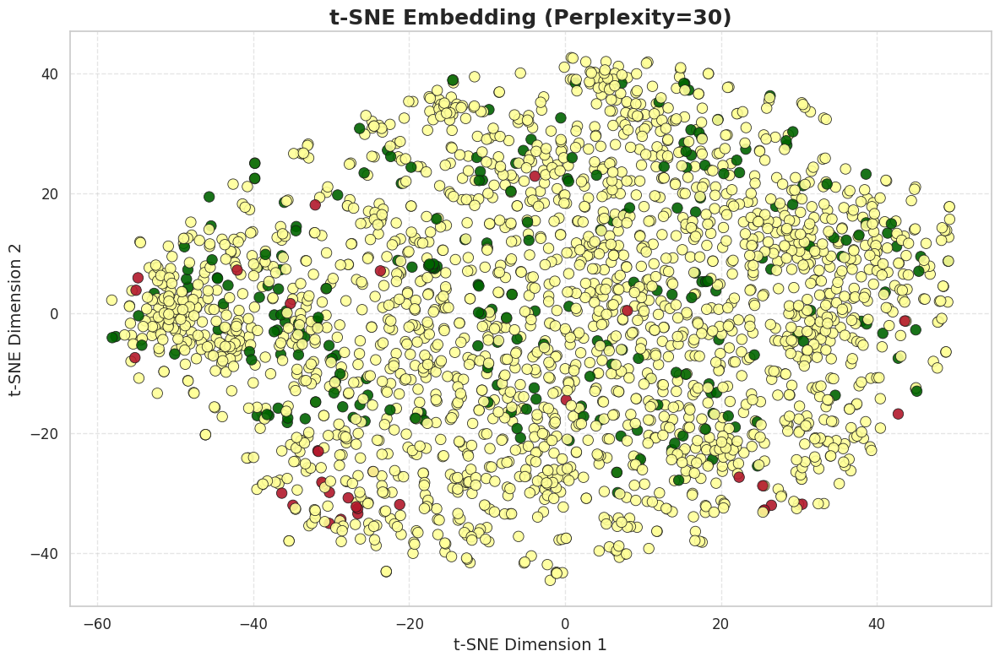

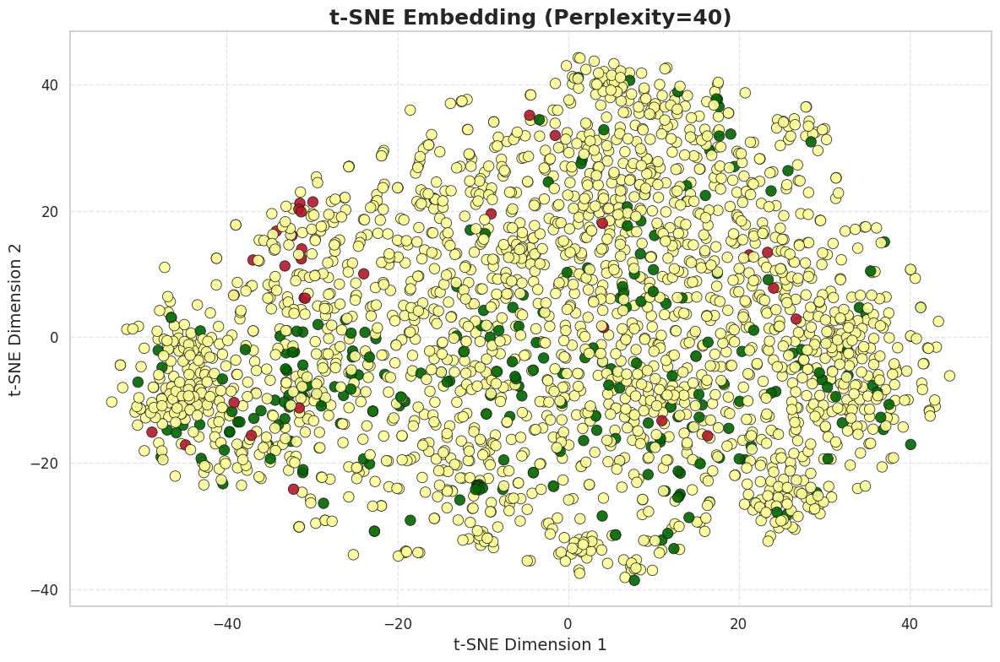

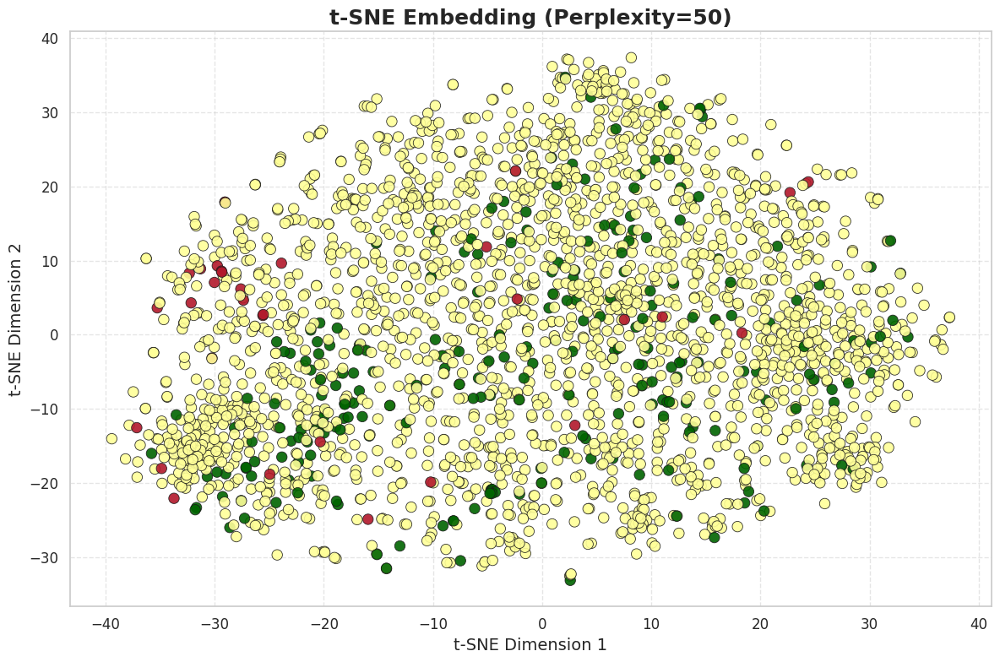

In [65]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set Seaborn style for a consistent, clean background
sns.set(style='whitegrid', context='notebook', palette='deep')

# Define a new, vibrant color palette for clarity
color_palette_vibrant = {
    0: '#b2182b',   # TopSingle_1 - dark red
    1: '#084081',   # TopSingle_2 - dark blue
    2: '#006400',   # MostFreqMulti - dark green
    3: '#FFFF99'    # Other - light yellow
}

# Loop over t-SNE embeddings for different perplexities
for perp in perplexities:
    coords = tsne_embeddings[perp]
    colors = [color_palette_vibrant[c] for c in color_index_codes]

    plt.figure(figsize=(12, 8))  # wider figure for clarity
    plt.scatter(
        coords[:, 0], coords[:, 1],
        c=colors,
        s=80,                  # slightly bigger markers
        alpha=0.9,             # more opaque
        edgecolor='k',         # black edges for separation
        linewidth=0.6,
        marker='o'
    )

    plt.title(f't-SNE Embedding (Perplexity={perp})', fontsize=18, fontweight='bold')
    plt.xlabel("t-SNE Dimension 1", fontsize=14)
    plt.ylabel("t-SNE Dimension 2", fontsize=14)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.5)  # subtle grid for readability
    plt.tight_layout()
    plt.show()


### **Choosing final perplexity**

Upon examining the t-SNE plots with various perplexity values, it was noted that low perplexities resulted in fragmented and scattered clusters, whereas high perplexities caused substantial overlap between classes. A moderate perplexity around 30 offered the most balanced visualization, producing well-defined clusters with clearer separations between labels. Therefore, selecting this value allows for meaningful local grouping while preserving the overall structure of the dataset.

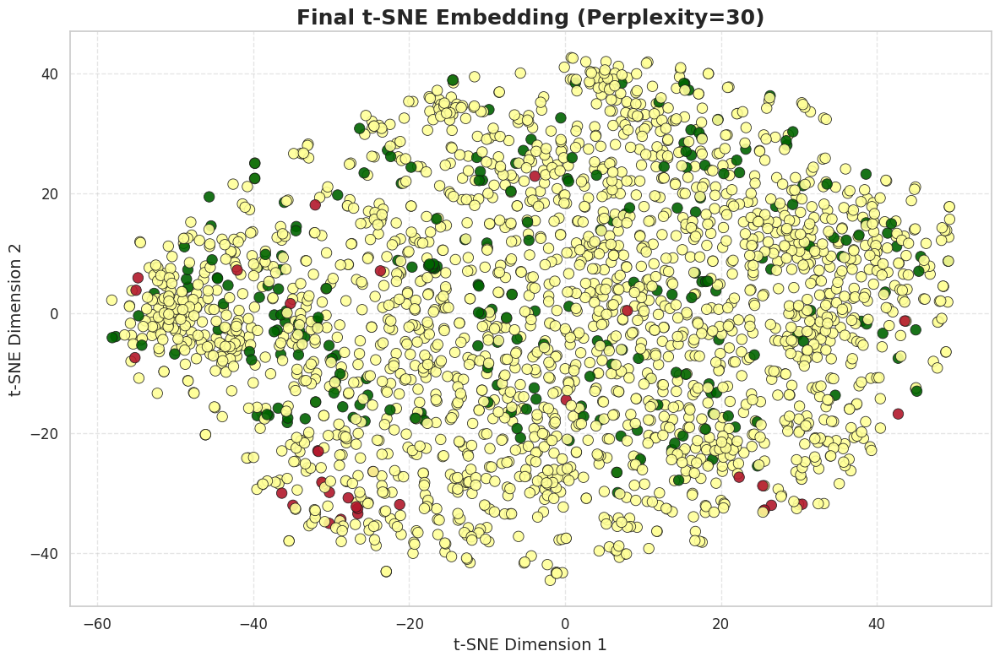

In [66]:
# Updated vibrant color palette: dark primary classes + light "Other"
color_palette_vibrant = {
    0: '#b2182b',   # TopSingle_1 - dark red
    1: '#084081',   # TopSingle_2 - dark blue
    2: '#006400',   # MostFreqMulti - dark green
    3: '#FFFF99'    # Other - light yellow
}

# Assign colors to each data point based on category
colors_final = [color_palette_vibrant.get(c, '#999999') for c in color_index_codes]

# Final t-SNE computation with selected perplexity
final_perplexity = 30
tsne_final_model = TSNE(
    n_components=2,
    perplexity=final_perplexity,
    random_state=42,
    init='pca',
    learning_rate='auto'
)
tsne_2d_final = tsne_final_model.fit_transform(X_features_scaled)

# Plot the final t-SNE embedding with the polished theme
plt.figure(figsize=(12, 8))
plt.scatter(
    tsne_2d_final[:, 0], tsne_2d_final[:, 1],
    c=colors_final,
    s=80,
    alpha=0.9,
    edgecolor='k',
    linewidth=0.6,
    marker='o'
)

# Titles and axis labels
plt.title(f'Final t-SNE Embedding (Perplexity={final_perplexity})', fontsize=18, fontweight='bold')
plt.xlabel("t-SNE Dimension 1", fontsize=14)
plt.ylabel("t-SNE Dimension 2", fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


### **Veracity inspection**

#### **Outliers**

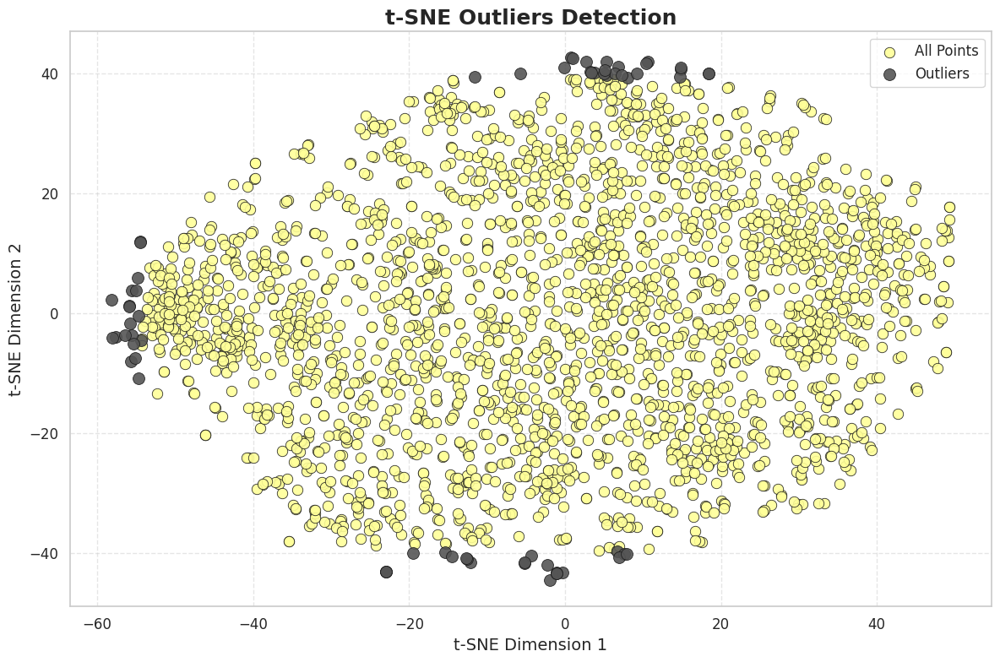

Number of outliers detected: 66


In [67]:
from scipy.stats import zscore
import numpy as np
import matplotlib.pyplot as plt

# Compute z-scores for each t-SNE dimension
z_dim1 = zscore(tsne_2d_final[:, 0])
z_dim2 = zscore(tsne_2d_final[:, 1])

# Identify outliers: points with z-score > 2 in either dimension
outlier_mask = (np.abs(z_dim1) > 2) | (np.abs(z_dim2) > 2)

# Plot t-SNE points and highlight outliers
plt.figure(figsize=(12, 8))

# Normal points: light yellow with black edge
plt.scatter(
    tsne_2d_final[~outlier_mask, 0], tsne_2d_final[~outlier_mask, 1],
    c='#FFFF99',        # light yellow
    s=80,
    alpha=0.9,
    edgecolor='k',      # black edges
    linewidth=0.6,
    marker='o',
    label='All Points'
)

# Outliers: dark grey with black edge
plt.scatter(
    tsne_2d_final[outlier_mask, 0], tsne_2d_final[outlier_mask, 1],
    c='#555555',        # dark grey
    s=100,
    alpha=0.9,
    edgecolor='k',
    linewidth=0.6,
    marker='o',
    label='Outliers'
)

# Titles and axis labels
plt.title('t-SNE Outliers Detection', fontsize=18, fontweight='bold')
plt.xlabel('t-SNE Dimension 1', fontsize=14)
plt.ylabel('t-SNE Dimension 2', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

# Grid and legend
plt.grid(True, linestyle='--', alpha=0.5)
plt.legend(fontsize=12)
plt.tight_layout()
plt.show()

# Display number of outliers
print("Number of outliers detected:", outlier_mask.sum())


#### **Noisy/Ambiguous Labels**

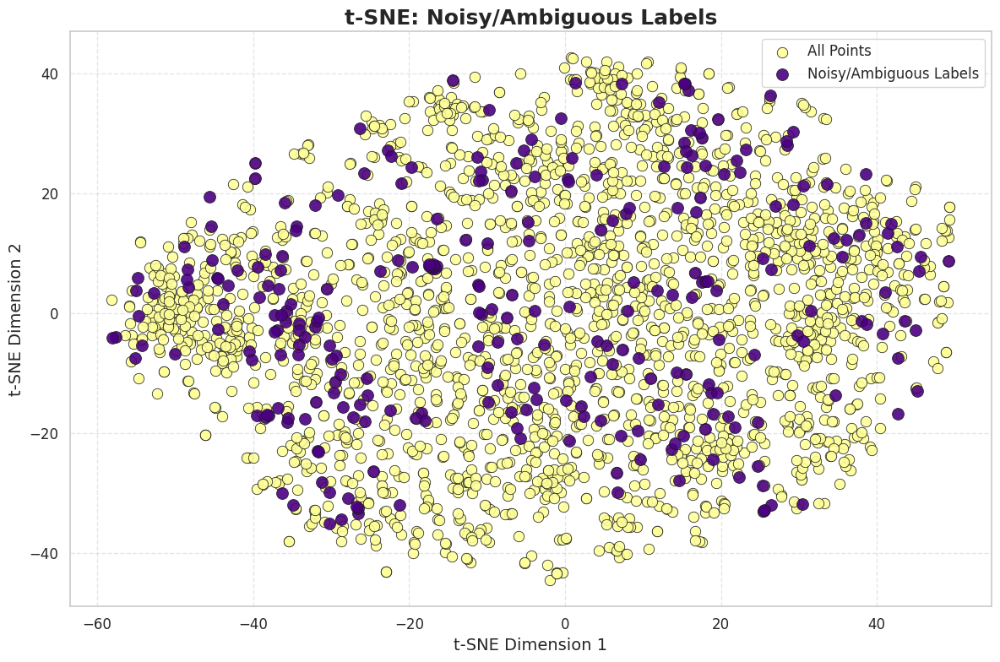

Number of potentially noisy labels: 269


In [68]:
from sklearn.neighbors import NearestNeighbors
import numpy as np
import matplotlib.pyplot as plt

# Fit Nearest Neighbors on t-SNE coordinates
nbrs = NearestNeighbors(n_neighbors=21).fit(tsne_2d_final)
_, indices = nbrs.kneighbors(tsne_2d_final)

# Determine the majority label among neighbors
neighbor_majority = []
for i in range(tsne_2d_final.shape[0]):
    neigh = color_index_codes[indices[i, 1:]]  # exclude self
    maj = np.bincount(neigh).argmax()
    neighbor_majority.append(maj)

neighbor_majority = np.array(neighbor_majority)

# Identify points whose label differs from neighbor majority
noisy_mask = (neighbor_majority != color_index_codes)

# Plot all points and highlight noisy/ambiguous points
plt.figure(figsize=(12, 8))

# Normal points: light yellow with black edge
plt.scatter(
    tsne_2d_final[~noisy_mask, 0], tsne_2d_final[~noisy_mask, 1],
    c='#FFFF99',          # light yellow
    s=80,
    alpha=0.9,
    edgecolor='k',
    linewidth=0.6,
    marker='o',
    label='All Points'
)

# Noisy/Ambiguous points: dark purple with black edge
plt.scatter(
    tsne_2d_final[noisy_mask, 0], tsne_2d_final[noisy_mask, 1],
    c='#4B0082',          # dark purple
    s=100,
    alpha=0.9,
    edgecolor='k',
    linewidth=0.6,
    marker='o',
    label='Noisy/Ambiguous Labels'
)

# Titles and axis labels
plt.title('t-SNE: Noisy/Ambiguous Labels', fontsize=18, fontweight='bold')
plt.xlabel('t-SNE Dimension 1', fontsize=14)
plt.ylabel('t-SNE Dimension 2', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

# Grid and legend
plt.grid(True, linestyle='--', alpha=0.5)
plt.legend(fontsize=12)
plt.tight_layout()
plt.show()

# Print count of potentially noisy labels
print("Number of potentially noisy labels:", noisy_mask.sum())


###**Hypothesis on what these unusual expression patterns might represent**

**These outliers may arise from several factors:**

1)Experimental errors or contamination in the dataset.

2)Rare biological states or unique responses to specific conditions that are not represented by the primary functional labels.

3)Data points that were inherently misclassified at the source.

#### **Hard-to-Learn Samples**

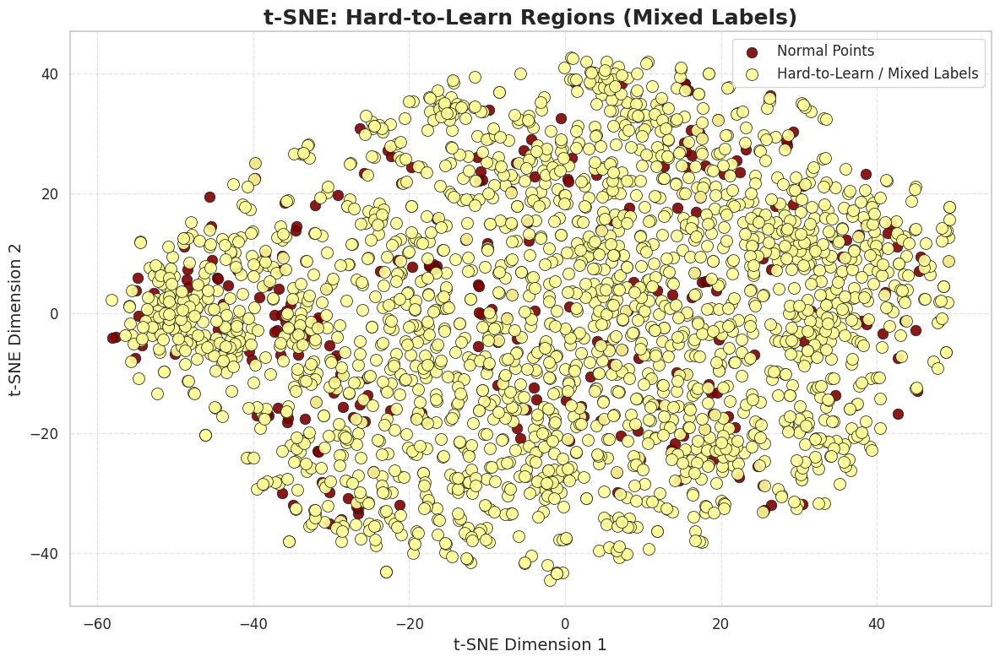

In [69]:

mixed_mask = (color_index_codes == 3)  # placeholder for mixed labels

plt.figure(figsize=(12, 8))

# Normal points: maroon with black edges
plt.scatter(
    tsne_2d_final[~mixed_mask, 0], tsne_2d_final[~mixed_mask, 1],
    c='#800000',  # maroon
    s=80,
    alpha=0.9,
    edgecolor='k',
    linewidth=0.6,
    marker='o',
    label='Normal Points'
)

# Hard-to-learn / mixed-label points: light yellow with black edges
plt.scatter(
    tsne_2d_final[mixed_mask, 0], tsne_2d_final[mixed_mask, 1],
    c='#FFFF99',  # light yellow
    s=100,
    alpha=0.9,
    edgecolor='k',
    linewidth=0.6,
    marker='o',
    label='Hard-to-Learn / Mixed Labels'
)

# Titles and axis labels
plt.title('t-SNE: Hard-to-Learn Regions (Mixed Labels)', fontsize=18, fontweight='bold')
plt.xlabel('t-SNE Dimension 1', fontsize=14)
plt.ylabel('t-SNE Dimension 2', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

# Grid and legend
plt.grid(True, linestyle='--', alpha=0.5)
plt.legend(fontsize=12)
plt.tight_layout()
plt.show()


**Simple classifiers tend to struggle in these regions**

These areas are challenging for simple classifiers because the classes are not linearly separable. Models such as logistic regression attempt to divide the classes with a straight decision boundary. In these mixed zones, however, no single line can accurately separate the points of different classes, resulting in a high rate of misclassification.

## **Part C — Isomap and Manifold Learning**

**Isomap vs. t-SNE**

Isomap aims to capture the global structure of your data. Instead of measuring straight-line distances, it calculates distances along the underlying curved surface of the dataset, preserving the intrinsic geometry. The result is a visualization that reflects the overall shape and large-scale relationships between all points, providing a faithful map of the dataset’s global layout.

On the other hand, t-SNE emphasizes local structure. Its goal is to ensure that points which are neighbors in the high-dimensional space remain close in the 2D embedding. This focus creates compact and visually distinct clusters, highlighting local groupings. However, because it prioritizes local relationships, the relative distances between clusters may be distorted and do not reliably reflect the global structure. In summary, t-SNE is excellent for exploring local clustering, while Isomap gives a clearer picture of the overall dataset landscape.

### **Implementation of Isomap**

In [71]:
from sklearn.manifold import Isomap

# Ensure scaled features are in a NumPy array
X_scaled = X_scaled_df.values  # or use your existing X_scaled if already defined

# Compute 2D Isomap embedding
isomap = Isomap(n_components=2, n_neighbors=10)
iso_2d = isomap.fit_transform(X_scaled)

# Display embedding shape
print('Isomap embedding shape:', iso_2d.shape)


Isomap embedding shape: (2417, 2)


### **Visualization**

In [72]:
# Updated color palette for Isomap visualization
color_palette_isomap = {
    0: '#b2182b',   # TopSingle_1 - dark red
    1: '#006400',   # TopSingle_2 - dark green
    2: '#FFFF99',   # MostFreqMulti / main category - light yellow
    3: '#B0B0B0'    # Other - gray
}

# Assign colors based on category codes
colors_iso = [color_palette_isomap.get(c, '#B0B0B0') for c in color_codes]

# Plot Isomap embedding
plt.figure(figsize=(12, 8))
plt.scatter(
    iso_2d[:, 0], iso_2d[:, 1],
    c=colors_iso,
    s=80,
    alpha=0.9,
    edgecolor='k',     # black edges
    linewidth=0.6,
    marker='o'
)

# Titles and axis labels
plt.title('Isomap Embedding (n_neighbors=10)', fontsize=18, fontweight='bold')
plt.xlabel("Isomap Dimension 1", fontsize=14)
plt.ylabel("Isomap Dimension 2", fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

# Grid for clarity
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


NameError: name 'color_codes' is not defined

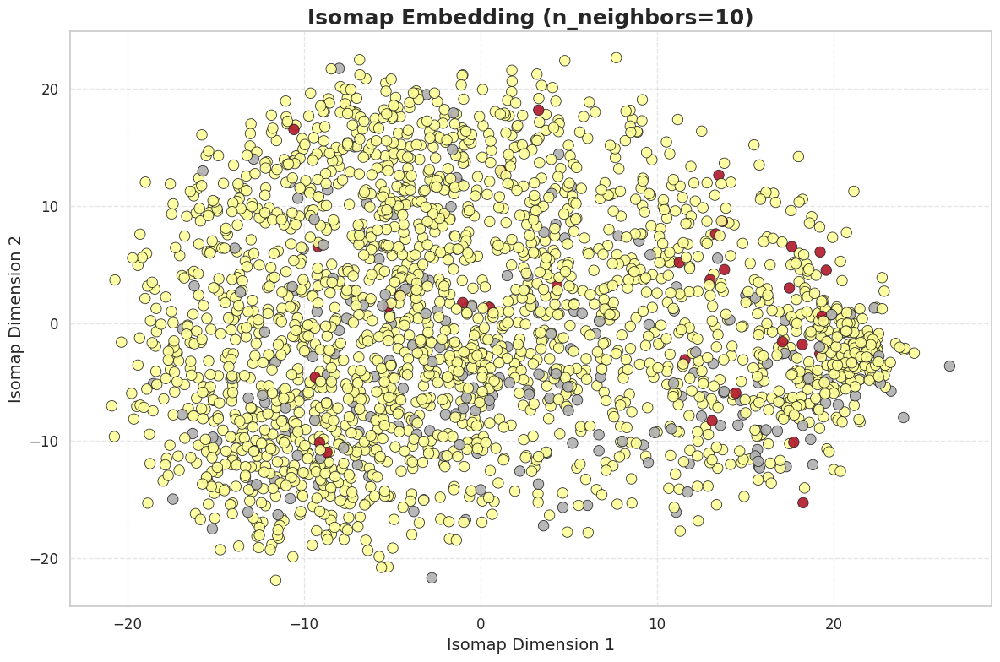

In [75]:
# Ensure the color codes variable exists
color_codes = color_index_codes  # replace with the correct variable if different

# Updated color palette for Isomap visualization
color_palette_isomap = {
    0: '#b2182b',   # TopSingle_1 - dark red
    1: '#006400',   # TopSingle_2 - dark green
    2: '#B0B0B0',   # MostFreqMulti / main category - grey
    3: '#FFFF99'    # Other - light yellow
}

# Assign colors based on category codes
colors_iso = [color_palette_isomap.get(c, '#B0B0B0') for c in color_codes]

# Plot Isomap embedding
plt.figure(figsize=(12, 8))
plt.scatter(
    iso_2d[:, 0], iso_2d[:, 1],
    c=colors_iso,
    s=80,
    alpha=0.9,
    edgecolor='k',     # black edges
    linewidth=0.6,
    marker='o'
)

# Titles and axis labels
plt.title('Isomap Embedding (n_neighbors=10)', fontsize=18, fontweight='bold')
plt.xlabel("Isomap Dimension 1", fontsize=14)
plt.ylabel("Isomap Dimension 2", fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

# Grid for clarity
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


### **Comparison & Curvature**

In [73]:
# Define polished color palette for comparison plot
color_palette_comparison = {
    0: '#b2182b',   # TopSingle_1 - dark red
    1: '#006400',   # TopSingle_2 - dark green
    2: '#FFFF99',   # MostFreqMulti / main category - light yellow
    3: '#B0B0B0'    # Other - gray
}

# Map colors to points
colors_comparison = [color_palette_comparison.get(c, '#B0B0B0') for c in color_codes]

# Create side-by-side figure
fig, axes = plt.subplots(1, 2, figsize=(16, 7))

# t-SNE plot
axes[0].scatter(
    tsne_2d_final[:, 0], tsne_2d_final[:, 1],
    c=colors_comparison,
    s=80,
    alpha=0.9,
    edgecolor='k',
    linewidth=0.6,
    marker='o'
)
axes[0].set_title('t-SNE', fontsize=16, fontweight='bold')
axes[0].set_xlabel("t-SNE Dimension 1", fontsize=14)
axes[0].set_ylabel("t-SNE Dimension 2", fontsize=14)
axes[0].grid(True, linestyle='--', alpha=0.5)

# Isomap plot
axes[1].scatter(
    iso_2d[:, 0], iso_2d[:, 1],
    c=colors_comparison,
    s=80,
    alpha=0.9,
    edgecolor='k',
    linewidth=0.6,
    marker='o'
)
axes[1].set_title('Isomap', fontsize=16, fontweight='bold')
axes[1].set_xlabel("Isomap Dimension 1", fontsize=14)
axes[1].set_ylabel("Isomap Dimension 2", fontsize=14)
axes[1].grid(True, linestyle='--', alpha=0.5)

# Overall title
fig.suptitle('Comparison of Dimensionality Reduction Techniques', fontsize=18, fontweight='bold')

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


NameError: name 'color_codes' is not defined

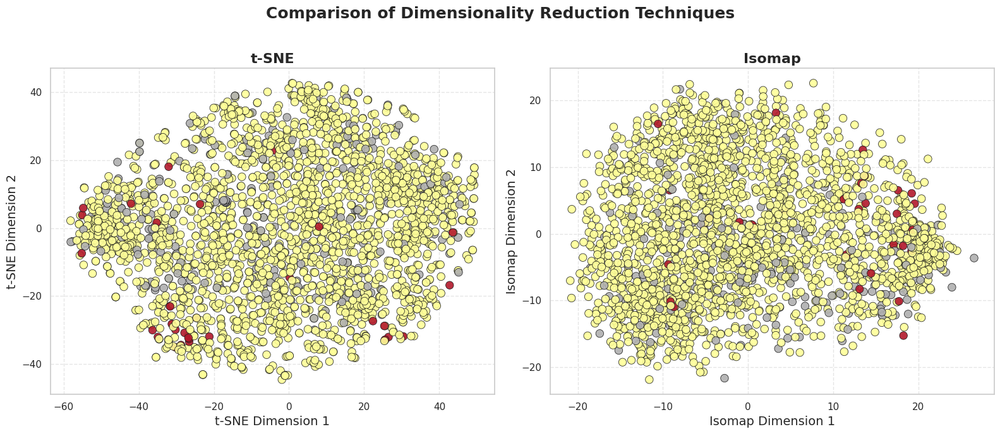

In [77]:
# Ensure the color codes variable exists
color_codes = color_index_codes  # categorical indices for coloring

# Define polished color palette for comparison plot
color_palette_comparison = {
    0: '#b2182b',   # TopSingle_1 - dark red
    1: '#006400',   # TopSingle_2 - dark green
    2: '#B0B0B0',   # MostFreqMulti / main category - gray
    3: '#FFFF99'    # Other - light yellow
}

# Map colors to points
colors_comparison = [color_palette_comparison.get(c, '#B0B0B0') for c in color_codes]

# Create side-by-side figure
fig, axes = plt.subplots(1, 2, figsize=(16, 7))

# t-SNE plot
axes[0].scatter(
    tsne_2d_final[:, 0], tsne_2d_final[:, 1],
    c=colors_comparison,
    s=80,              # bigger markers
    alpha=0.9,         # slightly more opaque
    edgecolor='k',     # black edges
    linewidth=0.6,
    marker='o'
)
axes[0].set_title('t-SNE', fontsize=16, fontweight='bold')
axes[0].set_xlabel("t-SNE Dimension 1", fontsize=14)
axes[0].set_ylabel("t-SNE Dimension 2", fontsize=14)
axes[0].grid(True, linestyle='--', alpha=0.5)

# Isomap plot
axes[1].scatter(
    iso_2d[:, 0], iso_2d[:, 1],
    c=colors_comparison,
    s=80,
    alpha=0.9,
    edgecolor='k',
    linewidth=0.6,
    marker='o'
)
axes[1].set_title('Isomap', fontsize=16, fontweight='bold')
axes[1].set_xlabel("Isomap Dimension 1", fontsize=14)
axes[1].set_ylabel("Isomap Dimension 2", fontsize=14)
axes[1].grid(True, linestyle='--', alpha=0.5)

# Overall title
fig.suptitle('Comparison of Dimensionality Reduction Techniques', fontsize=18, fontweight='bold')

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


**Comparing Isomap and t-SNE Visualizations**

Isomap and t-SNE offer two complementary perspectives on the same dataset. t-SNE is particularly effective at highlighting local structure, producing tight, visually distinct clusters that clearly show which points are nearest neighbors. However, the relative distances and positions of these clusters in the t-SNE plot may not accurately reflect the true global structure.

In contrast, Isomap excels at capturing the global structure of the gene expression data. While t-SNE often breaks the data into isolated “islands,” the Isomap embedding tends to display a more continuous, stretched-out formation—sometimes resembling a “V” or “U.” This indicates that clusters identified by t-SNE are not truly separate in high-dimensional space but are connected along an underlying continuous structure. By preserving long-range distances, Isomap provides a more faithful view of the dataset’s overall landscape.

**The Data Manifold and Classification Challenges**

The concept of a data manifold refers to high-dimensional data lying on a lower-dimensional, curved surface. Imagine a rolled-up sheet of paper: while it exists in 3D space, its intrinsic geometry is 2D. Isomap is designed to “unroll” this manifold, revealing its true shape.

The Isomap embedding suggests that the gene expression data resides on a highly curved, complex manifold. If the data were simple and linear, the embedding would appear more like a spherical cloud. The observed bent or “V”-shaped structure indicates that the relationships among gene profiles are non-linear and follow a complex geometric path.

This intrinsic complexity explains why classification can be challenging:

* Simple linear classifiers, such as logistic regression, attempt to separate classes with a straight line or flat plane.

* On a curved manifold, no single linear boundary can effectively separate the classes, and a straight-line decision would intersect clusters, causing misclassifications.

* Therefore, the manifold’s complexity implies that more advanced, non-linear models are necessary to accurately capture decision boundaries that follow the underlying geometry of the data.